# Ipywidgets
 * Interactive widgets for the Jupyter notebook
 * [Documentation: https://ipywidgets.readthedocs.io](https://ipywidgets.readthedocs.io)
 * [Github: https://github.com/jupyter-widgets/ipywidgets](https://github.com/jupyter-widgets/ipywidgets)

In [1]:
import ipywidgets as widgets

In [2]:
slider = widgets.FloatSlider(min=0, max=10, step=0.5)
slider

In [3]:
text = widgets.FloatText(value=1)
text 

In [5]:
text.value

8.0

In [6]:
text.value = 5
slider.value = 2

In [7]:
widgets.jslink((text, 'value'), (slider, 'value'))

In [ ]:
slider.value = 3.0

# Bqplot
 * Interactive plotting in the Jupyter notebook
 * [Documentation: https://bqplot.readthedocs.io](https://bqplot.readthedocs.io)
 * [Github: https://github.com/bloomberg/bqplot](https://github.com/bloomberg/bqplot)

In [8]:
import bqplot.pyplot as plt
import numpy as np

x = np.linspace(0, 2, 50)
y = x**2

fig = plt.figure()
scatter = plt.scatter(x, y)
plt.show()

In [11]:
fig.animation_duration = 500
scatter.y = x**1.6

In [12]:
scatter.selected_style = {'stroke':'red', 'fill': 'orange'}
plt.brush_selector()

In [13]:
scatter.selected

[21, 22, 23, 24]

In [14]:
scatter.selected = [1,2,10,40]

# Ipyleaflet
 * leaflet / Jupyter bridge enabling interactive maps in the notebook
 * https://github.com/ellisonbg/ipyleaflet

In [15]:
import ipyleaflet
ipyleaflet.Map(center = [53.2138252,6.5698672,18], zoom = 17)

In [16]:
_.add_layer(ipyleaflet.ImageOverlay(url='http://www.pygrunn.org/theme/images/logos/top_artwork_2017.png', bounds=_.bounds, opacity=0.5))
#_.add_layer(ipyleaflet.ImageOverlay(url='http://localhost:8888/static/base/images/logo.png', bounds=_.bounds, opacity=0.8))

# Integration with vaex

In [18]:
import vaex
dstaxi = vaex.open("/Users/maartenbreddels/vaex/data/nytaxi/nyc_taxi2015.hdf5") # mmapped, doesn't cost extra memory

In [ ]:
# dstaxi.plot_widget(dstaxi.col.pickup_longitude, dstaxi.col.pickup_latitude, f="log1p")

In [19]:
dstaxi.plot_widget("pickup_longitude", "pickup_latitude", f="log", backend="ipyleaflet", shape=400)

In [ ]:
dstaxi.count("dropoff_hour")

In [20]:
dstaxi.plot_widget("dropoff_longitude", "dropoff_latitude", f="log", backend="ipyleaflet",
                   z="dropoff_hour", type="slice", z_shape=24, shape=400, z_relative=True,
                   limits=[None, None, (-0.5, 23.5)])

In [21]:
ds = vaex.datasets.helmi_de_zeeuw.fetch()

In [22]:
ds.plot_widget("x", "y", f="log", limits=[-20, 20])

In [23]:
ds.plot_widget("Lz", "E", f="log")

# ipyvolume
 * 3d plotting for Python in the Jupyter notebook based on IPython widgets using WebGL
 * ~5 months old
 * Glyphs + Volume rendering (surfaces/meshes/lines are underway)
 * Live documentation http://ipyvolume.readthedocs.io/en/stable/ (since and thanks to ipywidgets 6)


In [24]:
import ipyvolume
import ipyvolume.pylab as plt3d
import numpy as np

In [25]:
ipyvolume.example_ylm()

In [26]:
!open CT_3D.html

In [27]:
N = 1000
x, y, z = np.random.random((3, N))

In [28]:
fig = plt3d.figure()
scatter = plt3d.scatter(x, y, z, marker='box')
plt3d.show()

In [29]:
scatter.color = "green"
scatter.size = 10

In [30]:
scatter.color = np.random.random((N,3))

/Users/maartenbreddels/anaconda3/envs/pygrunn/lib/python3.6/site-packages/traitlets/traitlets.py:567: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  silent = bool(old_value == new_value)


In [31]:
scatter.size = 2

In [32]:
plt3d.figure()
plt3d.style.use('dark')
quiver = plt3d.quiver(*ipyvolume.datasets.animated_stream.fetch().data[:,::,::4], size=5)
plt3d.animate_glyphs(quiver, interval=200)
plt3d.show()

In [33]:
quiver.geo = "cat"

In [34]:
quiver.geo = "arrow"

In [ ]:
# ds.plot_widget("x", "y", "z", backend="ipyvolume", f="log1p", shape=100, smooth_pre=0.5)

In [35]:
plot3d = ds.plot_widget("x", "y", "z", vx="vx", vy="vy", vz="vz",
                        backend="ipyvolume", f="log1p", shape=100, smooth_pre=0.5)

In [36]:
plot3d.vcount_limits = [60, 100000]

In [37]:
plot3d.backend.quiver.color = "red"

In [38]:
widgets.ColorPicker()

In [39]:
widgets.jslink((plot3d.backend.quiver, 'color'), (_, 'value'))

In [40]:
plt3d.save("pydata.html")

In [41]:
!open pydata.html

# A Billion stars in the Jupyter notebook

In [42]:
import vaex
gaia = vaex.open("ws://gaia:9000/gaia-dr1")

In [43]:
f"{len(gaia):,}" # (python3.6 f-string)

'1,142,679,769'

In [44]:
ra_dec_limits = [[0, 360], [-90, 90]]

In [45]:
gaia.plot_widget("ra", "dec", limits=ra_dec_limits)

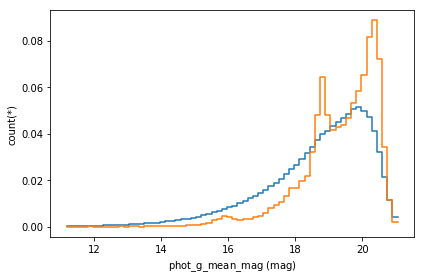

In [46]:
gaia.plot1d("phot_g_mean_mag", selection=False, n=True)
gaia.plot1d("phot_g_mean_mag", selection=True, show=True, n=True)